In [ ]:
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import numpy as np
import subprocess
import zipfile
import random
import json
import os
import cv2

# Download

In [2]:
download_url = 'https://studentiunict-my.sharepoint.com/personal/simone_palazzo_unict_it/_layouts/15/download.aspx?SourceUrl=%2Fpersonal%2Fsimone_palazzo_unict_it%2FDocuments%2FDatasets_released%2Ff4k_detection_tracking%2Ezip'

# Sharepoint doesn't allow automated downloads, so we need to manually download the zip file. 
# Simply copy this link into a browser, and the download will start automatically after authentication.

# Feel free to adjust the paths below to match your local setup.
extract_dir = 'f4k_detection_tracking'
zip_file = 'f4k_detection_tracking.zip' 
# This is the COCO output directory.
output_dir = "coco_outputs"

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# Optional.
# os.remove(zip_file)  

For ease of processing, we convert `.flv` into `.mp4`.

In [3]:
for filename in os.listdir(extract_dir):
    if filename.endswith(".flv"):
        input_path = os.path.join(extract_dir, filename)
        output_path = os.path.join(extract_dir, filename.replace(".flv", ".mp4"))

        cmd = [
            "ffmpeg",
            "-i", input_path,
            "-c:v", "libx264",
            "-preset", "veryfast",
            "-crf", "18",
            output_path
        ]

        subprocess.run(cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)

# Clean Annotations

In [4]:
def xml_to_coco(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    coco = {
        "images": [],
        "annotations": [],
        "categories": [],
    }

    category_set = {}
    annotation_id = 1
    
    cap = cv2.VideoCapture(xml_path.replace(".xml", ".flv"))
    vid_width, vid_height = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    for frame in root.findall("frame"):
        frame_id = int(frame.attrib["id"])
        image_id = frame_id
    
        coco["images"].append({
            "id": image_id,
            "file_name": f"{frame_id:06d}.jpg",  
            "width": vid_width,  
            "height": vid_height,  
        })

        for obj in frame.findall("object"):
            category_name = obj.attrib["objectType"]
            if category_name not in category_set:
                category_id = len(category_set) + 1
                category_set[category_name] = category_id
                coco["categories"].append({
                    "id": category_id,
                    "name": category_name,
                })
            else:
                category_id = category_set[category_name]

            contour = obj.find("contour").text.strip().split(',')
            segmentation = []
            for point in contour:
                x, y = map(float, point.split())
                segmentation.extend([x, y])

            xs = segmentation[::2]
            ys = segmentation[1::2]
            xmin = min(xs)
            ymin = min(ys)
            width = max(xs) - xmin
            height = max(ys) - ymin

            coco["annotations"].append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": category_id,
                "segmentation": [segmentation],
                "bbox": [xmin, ymin, width, height],
                "area": width * height,
                "iscrowd": 0,
            })
            annotation_id += 1

    return coco

os.makedirs(output_dir, exist_ok=True)

for filename in os.listdir(extract_dir):
    if filename.endswith(".xml"):
        xml_path = os.path.join(extract_dir, filename)
        coco_json = xml_to_coco(xml_path)
        output_filename = filename.replace(".xml", "_coco.json")
        output_path = os.path.join(output_dir, output_filename)
        with open(output_path, "w") as f:
            json.dump(coco_json, f, indent=2)

# Visualise

We visualize two randomly sampled frames from each video.

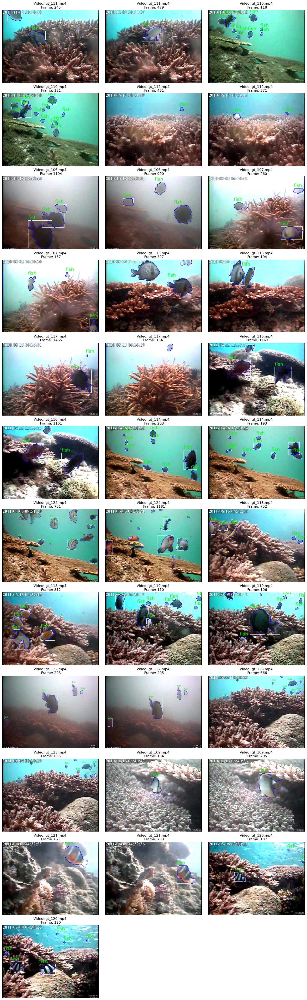

In [5]:
num_sample = 2
frames = []

for filename in os.listdir(extract_dir):
    if filename.endswith(".mp4"):
        video_path = os.path.join(extract_dir, filename)
        coco_path = os.path.join(output_dir, filename.replace('.mp4', '_coco.json'))
        
        with open(coco_path) as f:
            coco = json.load(f)

        cap = cv2.VideoCapture(video_path)
        ann_by_image = {}
        for annotation in coco["annotations"]:
            image_id = annotation["image_id"]
            if image_id not in ann_by_image:
                ann_by_image[image_id] = []
            ann_by_image[image_id].append(annotation)

        category_map = {cat["id"]: cat["name"] for cat in coco["categories"]}
        image_ids = [img["id"] for img in coco["images"]]
        sample_ids = random.sample(image_ids, min(num_sample, len(image_ids)))
        for image_id in sample_ids:
            frame_num = image_id + 3 if filename.endswith("122.mp4") else image_id
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
            width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
            height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
            ret, frame = cap.read()
            if not ret:
                continue

            annotations = ann_by_image.get(image_id, [])

            for annotation in annotations:
                x, y, w, h = map(int, annotation["bbox"])
                
                category_id = annotation["category_id"]
                label = category_map[category_id]
                cv2.rectangle(frame, 
                              (x, y), (x+w, y+h), (255, 255, 255), 1)
                cv2.putText(frame, label, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,
                            0.5, (0, 255, 0), 1, cv2.LINE_AA)

                if "segmentation" in annotation and annotation["segmentation"]:
                    pts = annotation["segmentation"][0]
                    pts = [(int(pts[i]), int(pts[i+1])) for i in range(0, len(pts), 2)]
                    cv2.polylines(frame, [np.array(pts)], isClosed=True, color=(255, 5, 0), thickness=1)

            frames.append((frame_num, frame, filename))
        cap.release()


num_frames = len(frames)
cols = min(num_frames, 3)
rows = (num_frames + cols - 1) // cols

plt.figure(figsize=(5 * cols, 4 * rows))
for idx, (frame_num, frame, filename) in enumerate(frames):
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title(f"Video: {filename} \n Frame: {frame_num}")
    plt.axis("off")

plt.tight_layout()
plt.show()
